# <p style="text-align: center;"> Summer Project (2023)- Bayesian Optimization </p>
#### <p style="text-align: center;">Raunak Gupta</p>
#### <p style="text-align: center;">Project Guide : Dr. Sourish Das</p>
<p style="text-align: center;">(The following project was done on-site at Chennai Mathematical Insitute from 1st June  to 22nd July)</p>

<p style="text-align: center;">contact : raunakgupta4082@gmail.com</p>



***Aim***: To understand and impliment Bayesian Optimization with Gaussian Processes, from scratch, in Julia programming language.

In [17]:
# Importing Dependencies
using Random, Distributions
using Plots 
using Distances 
using LinearAlgebra

Bayesian Optimization is a method , given the data , we try and estimate the maximum or minimum of the underlying function from which the data was generated. It is usually suitable when we have less number of data points. First we try and understand Gaussian Processes which is required for a step in Bayesian Optimization

# Gaussian Process 



In linear or logistic regression we start off with a finite number of basis functions and estimate its parameters and coefficients using regression. Gaussian process is an attempt to extend regression to infinite number of basis functions. 

**Gaussian Process**: Is a collection of random variables such that any finite number of them are taken together their joint distribution is Gaussian.

Gaussian processes are distributions over functions. So when we same from a Gaussian Process we get a function instead of the usual - a point. This distribution of functions is defined by a mean $m(x)$ and a covariance function $k(x, x')$. 
The GP is completely specified by its mean and covariance which are given by:

$m(x) = E[f(x)]$

$k(x,x')= E[(f(x)-m(x))(f(x')-m(x'))]$

If $f(x)$ is a Gaussian process then, 
$$f(x) \sim GP(m(x) , k(x ,x'))$$

Where x is taken as the points at which we evaluate the function.

Now for a finite set of x values , say $X = \{x_1 , x_2 , x_3 \dots , x_n\}$ we get a marginal distribution of the GP : 
$$f(X) \sim N(m(X) , k(X,X))$$

It follows the normal distribution because of the fact that the marginal distribution of a Gaussian distribution is a Gaussian.

---

Now to sample functions from a GP we need to define its mean and covariance functions. The covariance function , also known as the kernel here, implies a distribution over the functions f(x). If they are smooth, zig-zag, periodic , locally periodic ,etc. can be incorporated through the kernel. Hence it is possible to set prior information on the distribution.  

Also , a kernel is always positive definite. 



One of the most used kernel is the exponentiated quadratic covariance function also know as the Radial basis function kernel:

Exponentiated quadratic is defined as:
$$k_{y}(x_{p}, x_{q}) = \sigma^{2}_{f} \exp(-\frac{1}{2l^{2}}(x_{p} - x_{q})^2) + \sigma_{n}^2 \delta_{pq}$$ 

Where l is the length scale, $\sigma_{f}^2$ is the signal variance and $\sigma_{n}^2$ is the noise variance. These free parameters are generally called the hyperparameters.


(Note: Here we are taking $l= 1 , \sigma_f^2 = 1 $ and $\sigma_n^2 = 0$)

In [18]:
function exponentiated_quadratic(xa ,xb)
   
    sq_norm = -0.5 *  [sqeuclidean(xa[i] , xb[j]) for i in eachindex(xa), j in eachindex(xb)]
    return exp.(sq_norm)
end    

exponentiated_quadratic (generic function with 1 method)

Say we are given $n_1$ data points on the function and call them $y_1$. Now we want to estimate $n_2$ number of values at the points $X_2$. Call these points $y_2 = f(X_2)$. Note that $y_1 $ and $ y_2$ are jointly normal since they come from a normal distribution. Hence
$\begin{bmatrix} y_1 \\
y_2
\end{bmatrix} \sim N (\begin{bmatrix} m(X_1) \\
m(X_2)
\end{bmatrix} ,\begin{bmatrix} \Sigma_{11} & \Sigma_{12}\\
\Sigma_{21} & \Sigma_{22}
\end{bmatrix} )$



We want to find $p (y_2 | y_1 , X_1 , X_2)$.
We can get it by taking the conditional distribution , and knowing the formula for the conditional distribution for Normal distributions, we get:

$p (y_2 | y_1 , X_1 , X_2) = N (\mu_{2|1} , \Sigma_{2|1})$ , where

$$\mu_{2|1} = (\Sigma_{11}^{-1} \Sigma_{12}) ^T y_1  $$

And for the Covariance matrix of the posterior distribution is:

$$\Sigma_{2|1} = \Sigma_{22} - (\Sigma_{11}^{-1} \Sigma_{12})^T \Sigma_{12}$$

In [19]:
function GP( X1 , y1 , X2 , kernel_func)

    cov11 = kernel_func(X1 , X1) + Matrix( 1e-6*I, length(X1), length(X1))
    cov12 = kernel_func(X1 ,X2) + Matrix( 1e-6*I, length(X1), length(X2))
    cov22 = kernel_func(X2 , X2) + Matrix( 1e-6*I, length(X2), length(X2))

    mu_pos = (inv(cov11) * cov12)' * y1
    cov_pos = cov22 - (inv(cov11) * cov12)' * cov12

    return mu_pos , cov_pos
end

GP (generic function with 1 method)

*Note*: That we have added an identity matrix to the matrices. This is because when sampling, the points can get very close to each other, and hence 2 columns of the matrix become , essentially, collinear and hence singular. To prevent that we add a very small amount to the diagonals to prevent this. 

In [20]:
n1 = 5
n2 = 100
ny = 5
domain = (-6,6)
Random.seed!(1)

X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )
# y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
# y1 = sin.(X1)./X1


y1 = sin.(X1)./ (X1) 

X2 = LinRange(domain[1] , domain[2] , n2 )

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic)  
sigma2 = sqrt.(diag(cov2))

y2 =rand( MvNormal(vec(mu2), Symmetric(cov2)), ny)  # getting the ny number of functions from the Gaussian Process

100×5 Matrix{Float64}:
 -1.58055     0.788306  -2.01466     2.20891   -0.212679
 -1.54895     0.759144  -1.83412     2.15818   -0.163267
 -1.47828     0.730501  -1.61049     2.06173   -0.064949
 -1.3798      0.697913  -1.35278     1.92698    0.076551
 -1.25428     0.660192  -1.076       1.76426    0.251728
 -1.1071      0.61387   -0.795524    1.58523    0.4511
 -0.945973    0.56181   -0.532707    1.39842    0.665058
 -0.775811    0.500966  -0.306436    1.21339    0.87153
 -0.603922    0.430993  -0.132282    1.02129    1.06482
 -0.432541    0.356407  -0.0209417   0.835795   1.22403
  ⋮                                            
 -0.773954   -0.496027  -1.80682    -1.6099    -0.231616
 -0.63385    -0.558548  -1.6823     -1.67711   -0.251499
 -0.485323   -0.647687  -1.52209    -1.66599   -0.273606
 -0.337761   -0.762093  -1.33432    -1.57655   -0.297982
 -0.19881    -0.890589  -1.12762    -1.41356   -0.328331
 -0.072123   -1.02892   -0.913736   -1.1847    -0.360587
  0.0329906  -1.16675 

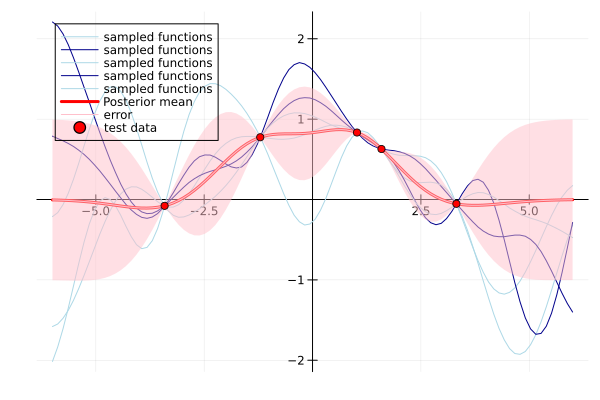

In [21]:
p = plot(legend=:topleft ,bg_legend = :transparent)
for i in range(1,ny)
    plot!(X2,y2[:,i] , label = "sampled functions" , framestyle = :origin,palette=:blues)

end
plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")


scatter!(X1,y1,c="red" , label="test data") 
display(p)

The pink shaded region shows the variance. 
Note: This is for the case when variance at the data points is zero.

# Bayesian Optimization

Bayesian optimization is one of the tool that we use to find the maximum or minimum of a function. We usually call the function the objective function. 

***Advantages of BO***:
It is useful when we have data points from a function, which we dont know , and evaluating more points is expensive or not feasible. For example, data of a rare disease. Also it is successful in navigating through local minimas which the popular regression models struggle at.

***The Algorithm***:
Using the data we have, we get a surrogate function which is an estimate of the objective function. One of the most popular ways to get this , is what we discussed above: Gaussian Processes.

Now we wish to sample more points. So for that uncertainity of points near our given points is less, so we could sample from there. But this would lead to not knowing the value of the functions at other places and we could very well miss the maxima or minima. But exploring unknown regions might lead us to a bad estimate. Hence we must balance out the exploration and exploitation (that is sampling from where we are more certain of being correct) to get the best estimate. Hence we use an aquisition function to get samples from the function ,which ideally explore and exploit optimally.

Now the new data is added to the exsisting data. Lets say we had $n_1$ data points. Now we will have $n_1 +1$ data points. Now this as the new dataset, repeat the above process.

***Disadvantages of using BO***:
For large datasets , applying GP is very expensive (complexity of $O(n^3)$)

---

We will now finally impliment Bayesian Optimization in Julia. We look at the following aquisition functions
- Probability of Improvement
- Probability of Improvement with trade-off parameter
- Expected Improvement with trade-off parameter
- Upper Confidence Bound

---

We are doing it for $sin(x)$. It is the underlying function, so we will sample a few points from it and see if our model can estimate the maximum or not of the objective function. NOTE: the model does not know the points are being sampled from  $sin(x)$.

## Probability of Improvement (PI)

$PI(x) =  \Phi(\frac{\mu(x) - f(x^*)}{\sigma(x)})$  , Where $\Phi$ is the cumulative distribution of the standard normal

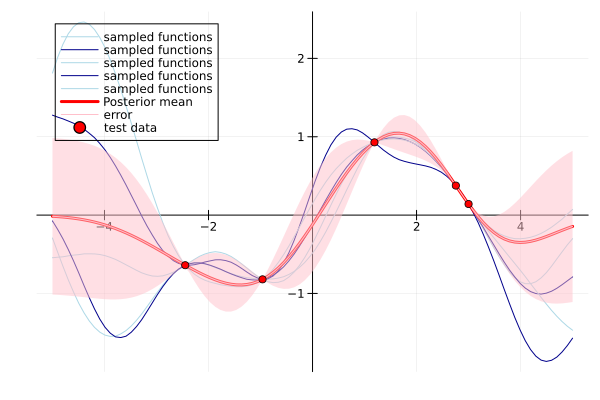

In [22]:
n1 = 5
n2 = 100
ny = 5
domain = (-5,5)
Random.seed!(3)
X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )

# Function we want to estimate:
# y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
# y1 = sin.(X1)./X1
y1 = sin.(X1)
# y1 = sin.(X1) + cos.(X1)
# y1 = 5(X1)
# y1 = sin.(1 ./X1)

X2 = LinRange(domain[1] , domain[2] , n2 )

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))


y2 =rand( MvNormal(vec(mu2), Symmetric(cov2)), ny)
plot(legend=:topleft ,bg_legend = :transparent)
for i in range(1,ny)
    p = plot!(X2,y2[:,i] , label = "sampled functions" , framestyle = :origin,palette=:blues)
end

plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
scatter!(X1,y1,c="red" , label="test data") 
display(p)

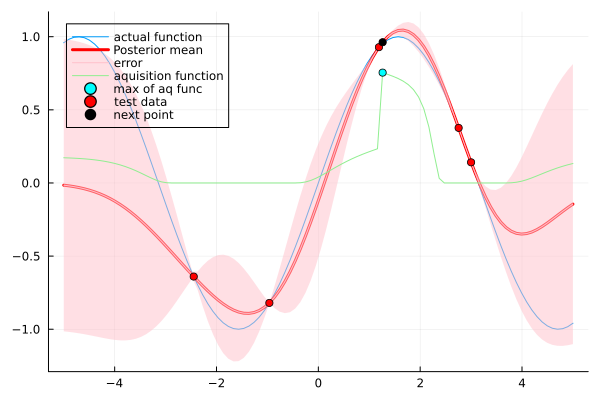

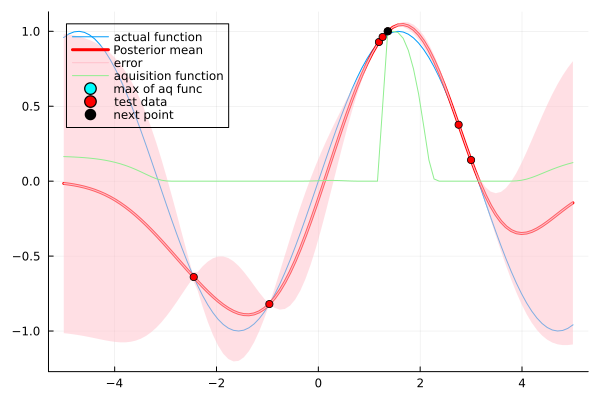

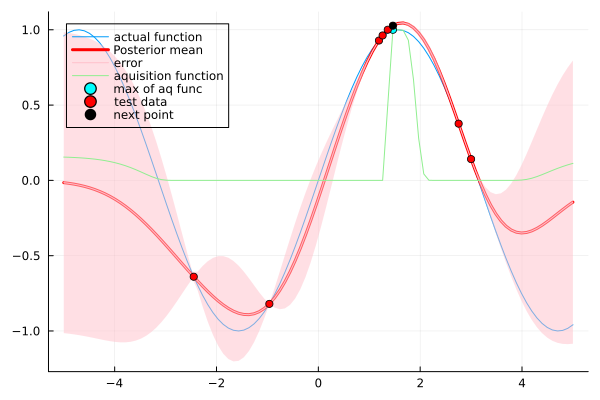

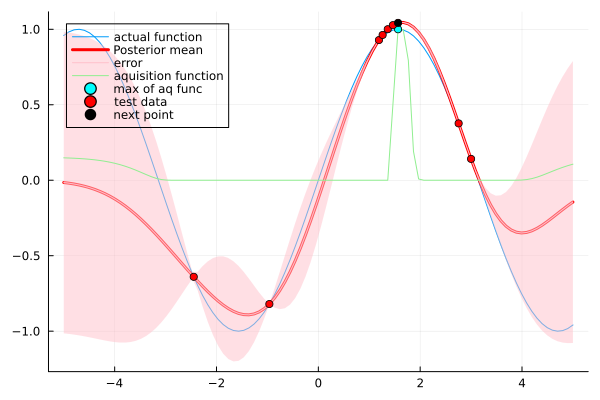

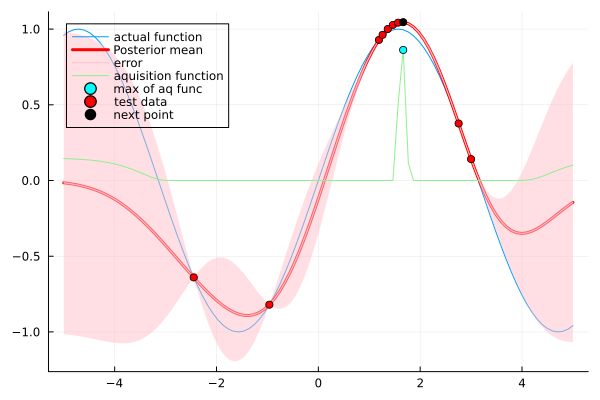

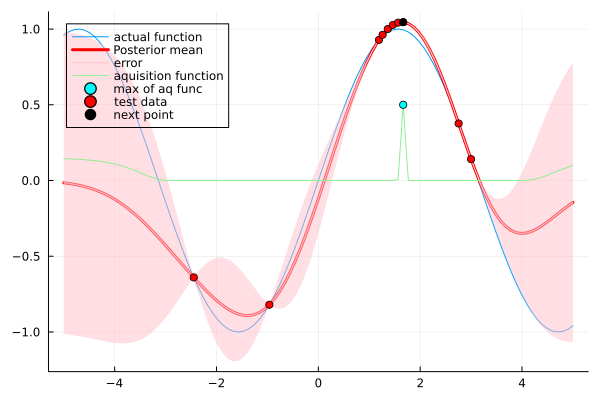

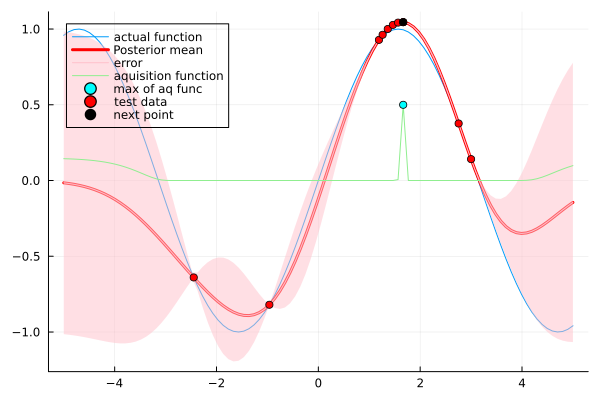

In [23]:
iteration = 7
ps = repeat([plot()], iteration)
Random.seed!(23)
# X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )
# y1 = sin.(X1)./X1

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))
cov2 = cov2 + Matrix( 1e-5*I, n2, n2)

for i in range(1,iteration)
    # println("plot $i")
    y_best = maximum(y1)

    
    aquisition_func = cdf((Normal(0,1)), (vec(mu2) .- y_best)./sigma2)
    

    X1 = [X1 ; X2[argmax(aquisition_func)] ]

    # Function we want to estimate:
    # y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
    # y1 = sin.(X1)./X1
    # y1 = sin.(X1)
    y1 = [y1 ; mu2[argmax(aquisition_func)] ]

    X2 = LinRange(domain[1] , domain[2] , n2 )

    mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic)
    sigma2 = sqrt.(diag(cov2))

    ps[i] = plot(legend=:topleft ,bg_legend = :transparent)
    plot!(X2,sin.(X2) ,label = "actual function" )
    plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
    plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
    plot!( X2 , aquisition_func,label = "aquisition function", c="light green")
    scatter!((X2[argmax(aquisition_func)],maximum(aquisition_func)),c="cyan" , label = "max of aq func")
    scatter!(X1,y1,c="red" , label="test data") 
    scatter!((X2[argmax(aquisition_func)], mu2[argmax(aquisition_func)] ),c="black" , label = "next point")
    display(ps[i])

end

As we can see this aquisition is purely exploitative. That is as soon as it find a maximum it only samples from it. So for increasing the exploration done by the algorithm we add a trade-off parameter:

## PI with trade-off parameter $\xi$

$PI(x) =  \Phi(\frac{\mu(x) - f(x^*) - \xi}{\sigma(x)})$

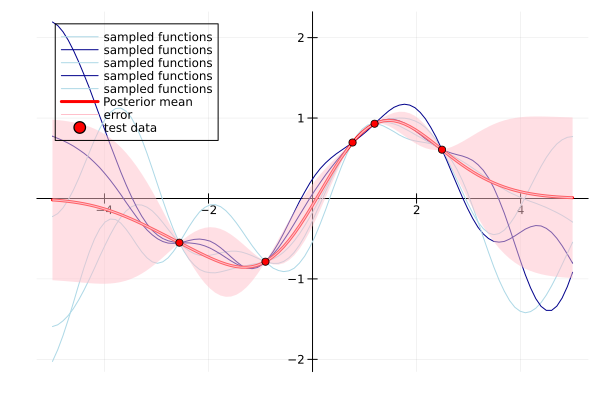

In [24]:
n1 = 5
n2 = 100
ny = 5
domain = (-5,5)
Random.seed!(1)
X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )

# Function we want to estimate:
# y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
# y1 = sin.(X1)./X1
y1 = sin.(X1)
# y1 = sin.(X1) + cos.(X1)
# y1 = 5(X1)
# y1 = sin.(1 ./X1)
X2 = LinRange(domain[1] , domain[2] , n2 )

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))

y2 =rand( MvNormal(vec(mu2), Symmetric(cov2)), ny)

plot(legend=:topleft ,bg_legend = :transparent)
for i in range(1,ny)
    p = plot!(X2,y2[:,i] , label = "sampled functions" , framestyle = :origin,palette=:blues)
end

plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
scatter!(X1,y1,c="red" , label="test data") 
display(p)

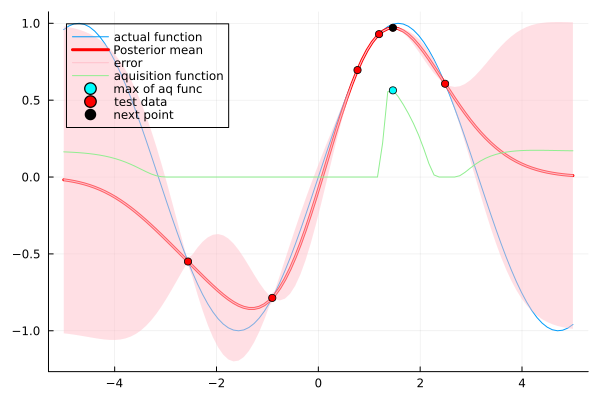

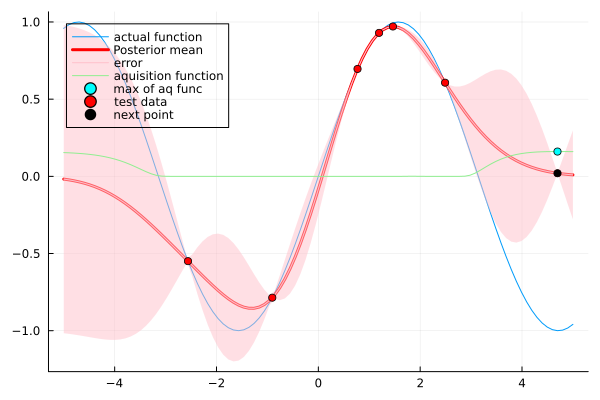

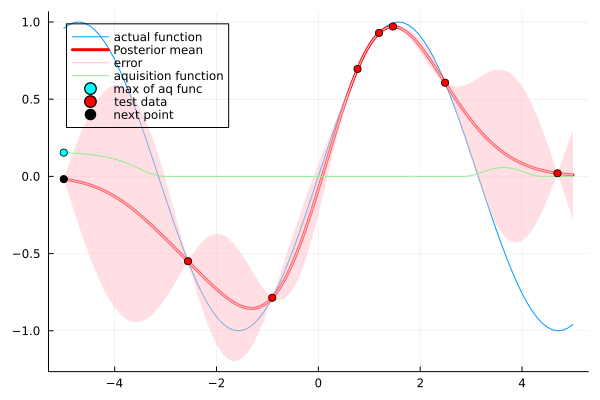

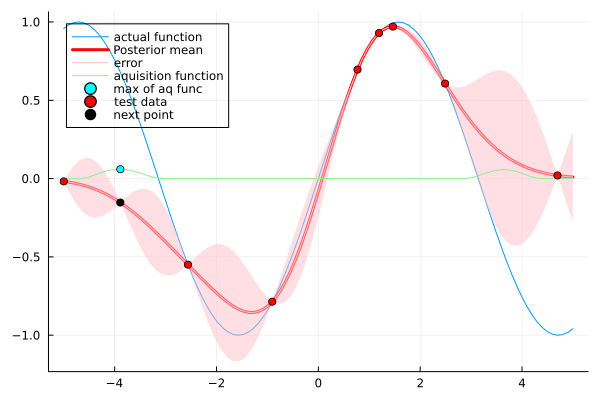

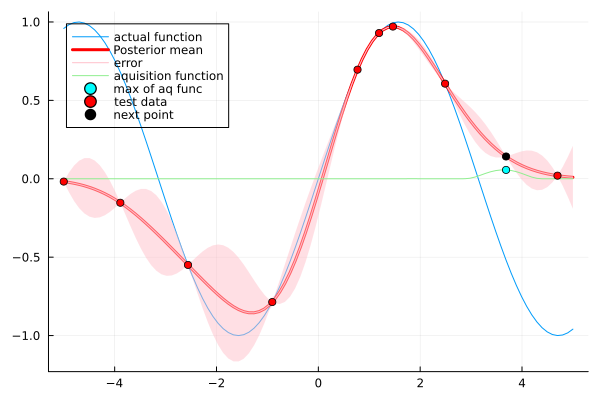

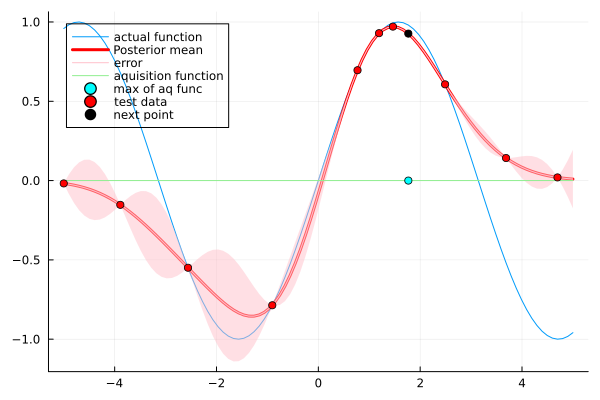

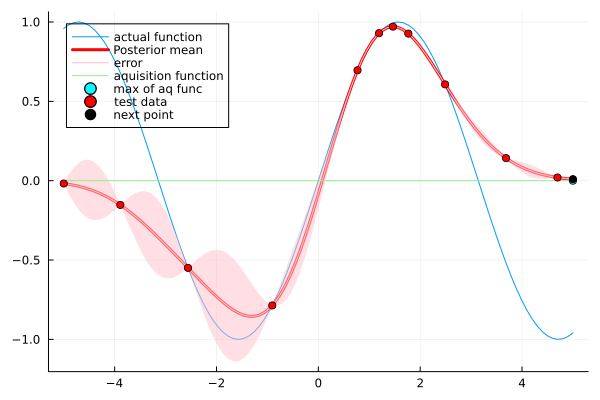

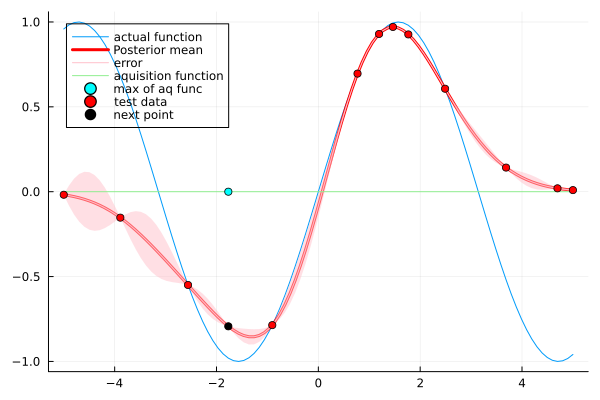

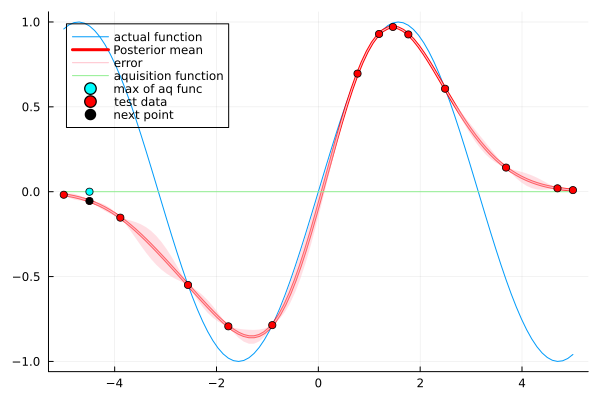

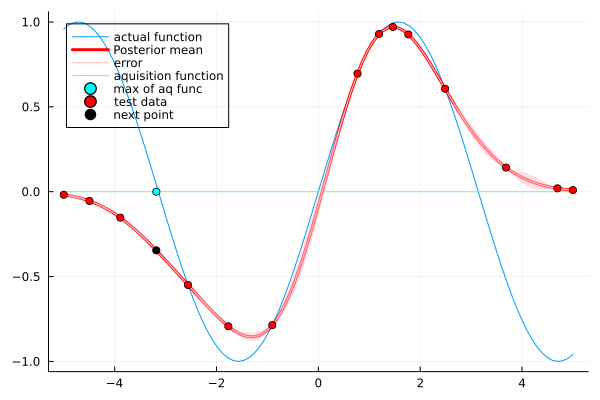

In [25]:
iteration = 10
ps = repeat([plot()], iteration)
Random.seed!(1)
# X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )
# y1 = sin.(X1)./X1


mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))
cov2 = cov2 + Matrix( 1e-5*I, n2, n2)

for i in range(1,iteration)
    # println("plot $i")
    y_best = maximum(y1)
    ξ = 0.03
    aquisition_func = cdf((Normal(0,1)), (vec(mu2) .- (y_best + ξ) )./sigma2)
    

    X1 = [X1 ; X2[argmax(aquisition_func)] ]
    y1 = [y1 ; mu2[argmax(aquisition_func)] ]

    X2 = LinRange(domain[1] , domain[2] , n2 )

    mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic)

    sigma2 = sqrt.(diag(cov2))

    ps[i] = plot(legend=:topleft ,bg_legend = :transparent)
    plot!(X2,sin.(X2)  ,label = "actual function" )
    plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
    plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
    plot!( X2 , aquisition_func,label = "aquisition function", c="light green")
    scatter!((X2[argmax(aquisition_func)],maximum(aquisition_func)),c="cyan" , label = "max of aq func")
    scatter!(X1,y1,c="red" , label="test data") 
    scatter!((X2[argmax(aquisition_func)], mu2[argmax(aquisition_func)] ),c="black" , label = "next point")
    display(ps[i])

end

## Expected Improvement (EI)

$EI(x) = (\mu - f(x^*) - \xi) \Phi \frac{\mu - f(x^*)-\xi}{\sigma} + \sigma \phi\frac {\mu - f(x^*) - \xi}{\sigma}$ 

Where $\phi$ is the standard normal distribution and $\Phi$ is the cumulative distribution of the standard normal

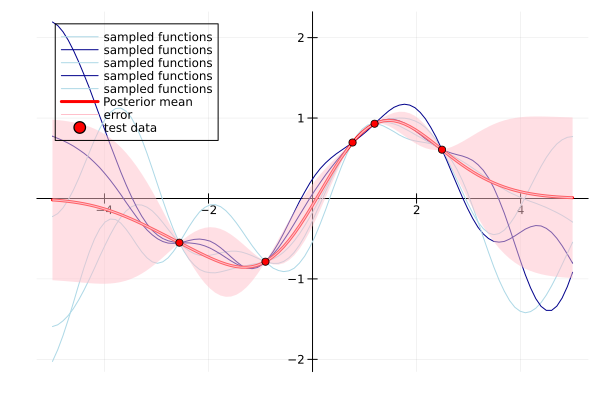

In [26]:
n1 = 5
n2 = 100
ny = 5
domain = (-5,5)
Random.seed!(1)
X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )

# Function we want to estimate:
# y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
y1 = sin.(X1)
# y1 = sin.(X1)
# y1 = sin.(X1) + cos.(X1)
# y1 = 5(X1)
# y1 = sin.(1 ./X1)

X2 = LinRange(domain[1] , domain[2] , n2 )

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 

sigma2 = sqrt.(diag(cov2))

y2 =rand( MvNormal(vec(mu2), Symmetric(cov2)), ny)
plot(legend=:topleft ,bg_legend = :transparent)
for i in range(1,ny)
    p = plot!(X2,y2[:,i] , label = "sampled functions" , framestyle = :origin,palette=:blues)
end

plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
scatter!(X1,y1,c="red" , label="test data") 
display(p)

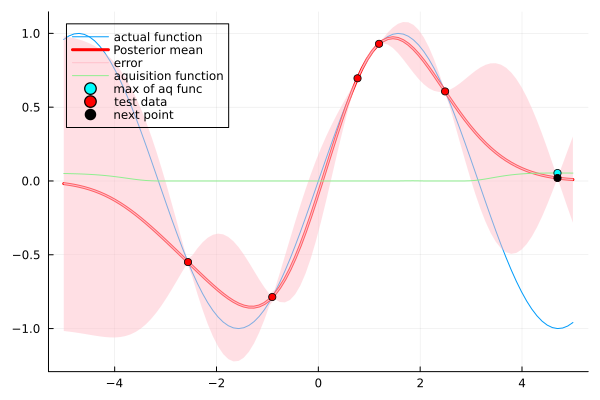

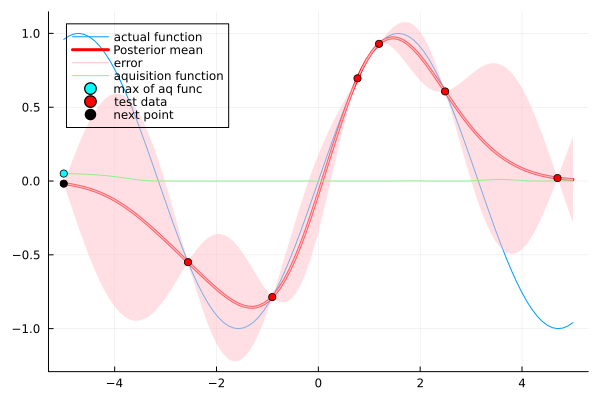

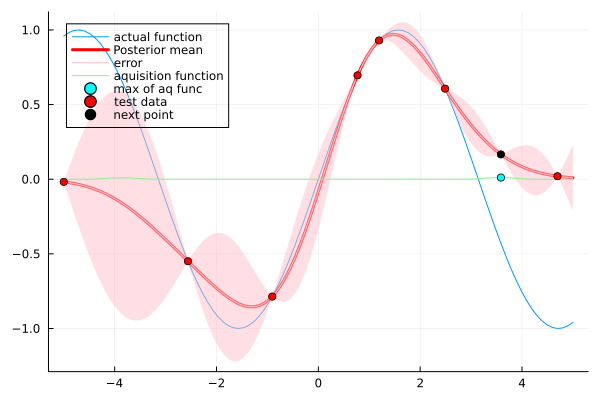

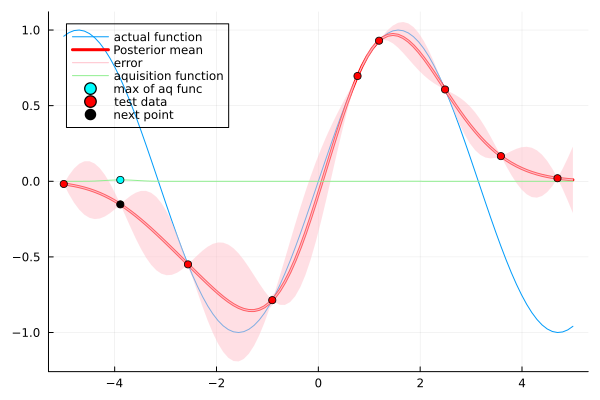

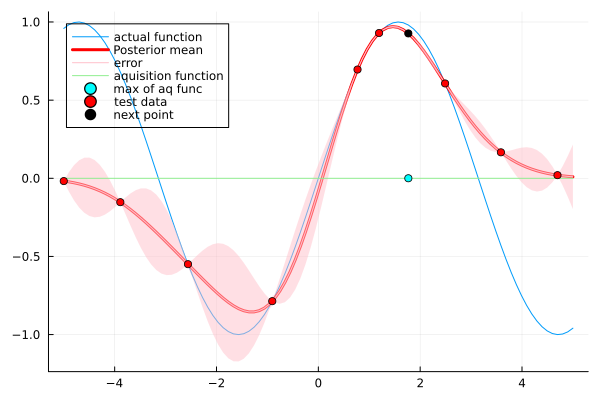

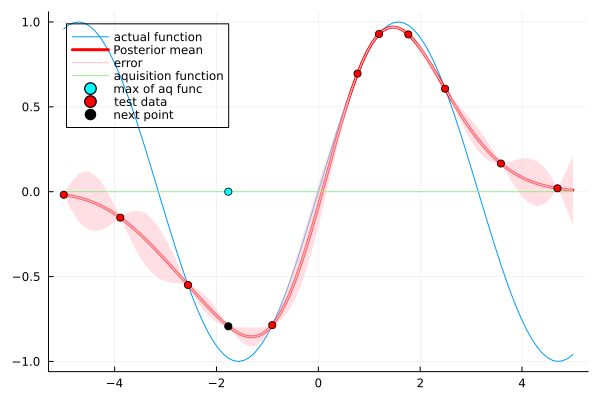

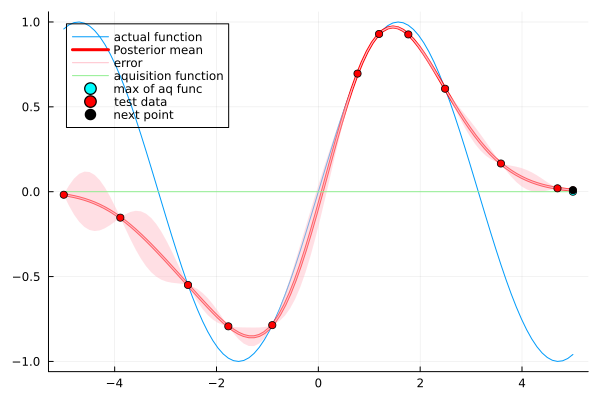

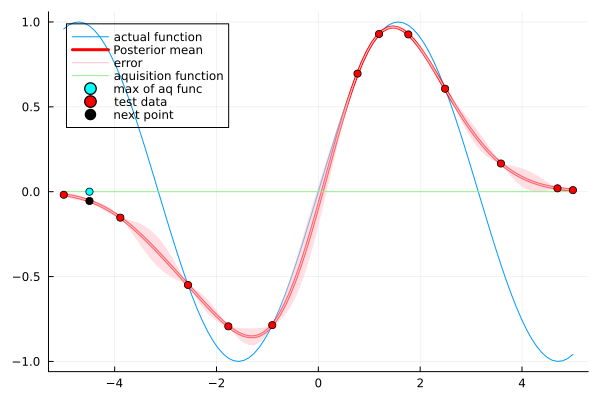

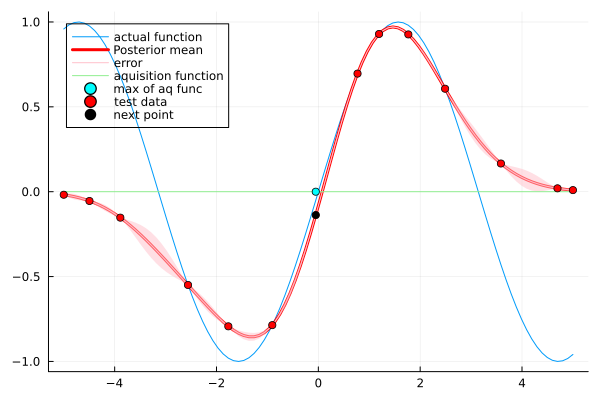

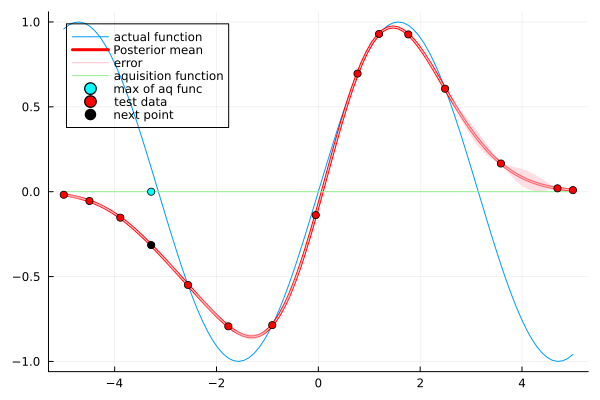

In [27]:
iteration = 10
ps = repeat([plot()], iteration)
Random.seed!(1)

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))
cov2 = cov2 + Matrix( 1e-5*I, n2, n2)

for i in range(1,iteration)
    # println("plot $i")
    y_best = maximum(y1)
    ξ = 0.3
    Z =  ((mu2) .- (y_best + ξ) )./sigma2

    aquisition_func = ((mu2) .- (y_best + ξ)) .* cdf.( (Normal(0,1)), Z ) .+  sigma2 .*( pdf.( (Normal(0,1)), Z ) )
    
    X1 = [X1 ; X2[argmax(aquisition_func)] ]

    # Function we want to estimate:
    # y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
    # y1 = sin.(X1)./X1
    # y1 = sin.(X1)
    y1 = [y1 ; mu2[argmax(aquisition_func)] ]

    X2 = LinRange(domain[1] , domain[2] , n2 )

    mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic)

    sigma2 = sqrt.(diag(cov2))

    ps[i] = plot(legend=:topleft ,bg_legend = :transparent)

    plot!(X2,sin.(X2) ,label = "actual function" )
    plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
    plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
    plot!( X2 , aquisition_func,label = "aquisition function", c="light green")
    scatter!((X2[argmax(aquisition_func)],maximum(aquisition_func)),c="cyan" , label = "max of aq func")
    scatter!(X1,y1,c="red" , label="test data") 
    scatter!((X2[argmax(aquisition_func)], mu2[argmax(aquisition_func)] ),c="black" , label = "next point")
    display(ps[i])

end

## Upper Confidence Bound (UCB)

$a(x,\lambda) = \mu(x) + \lambda \sigma(x)$

Where $\lambda$ is a hyperparameter which controls the weight given to exploration. Higher the $\lambda$ higher is the importance given to exploration.




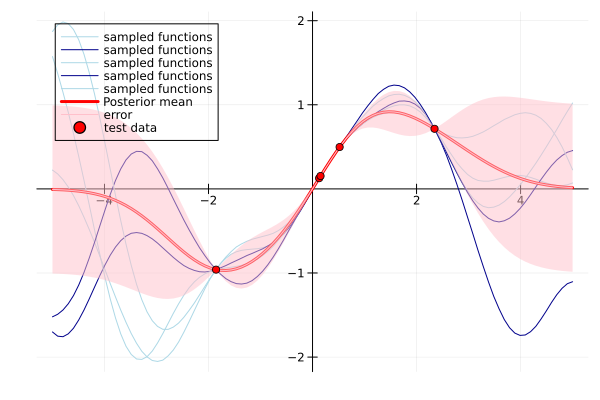

In [28]:
n1 = 5
n2 = 100
ny = 5
domain = (-5,5)
Random.seed!(123)
X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )

# Function we want to estimate:
# y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
y1 = sin.(X1)
# y1 = sin.(X1)
# y1 = sin.(X1) + cos.(X1)
# y1 = 5(X1)
# y1 = sin.(1 ./X1)

X2 = LinRange(domain[1] , domain[2] , n2 )

mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))

y2 =rand( MvNormal(vec(mu2), Symmetric(cov2)), ny)
plot(legend=:topleft ,bg_legend = :transparent)
for i in range(1,ny)
    p = plot!(X2,y2[:,i] , label = "sampled functions" , framestyle = :origin,palette=:blues)
end

plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
scatter!(X1,y1,c="red" , label="test data" , ) 
display(p)

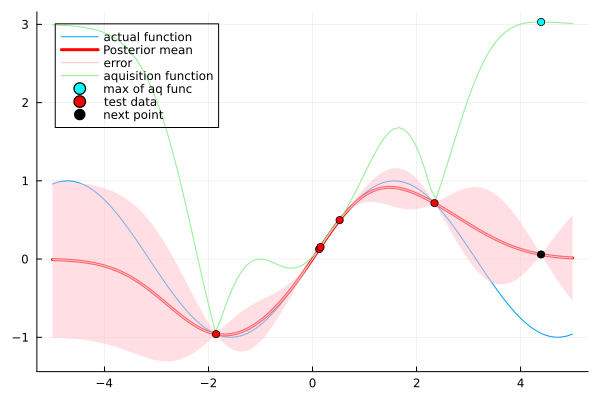

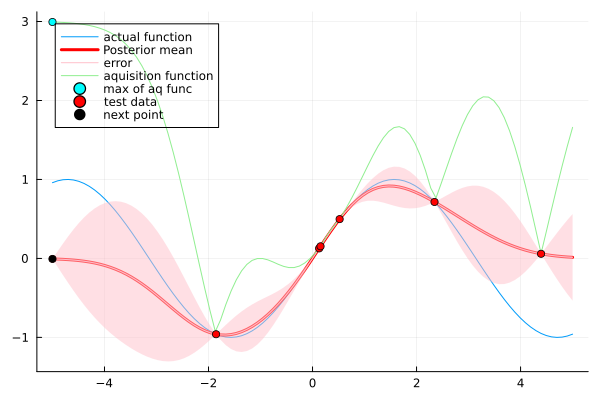

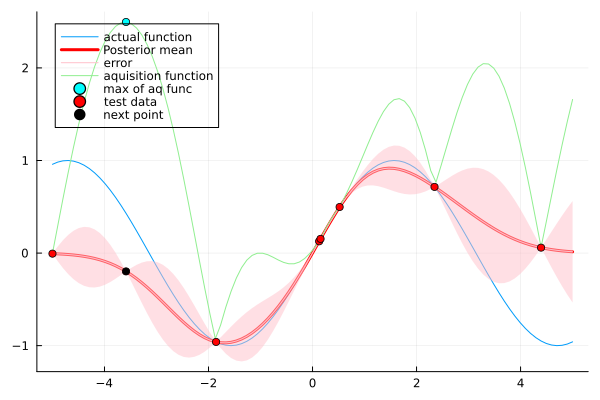

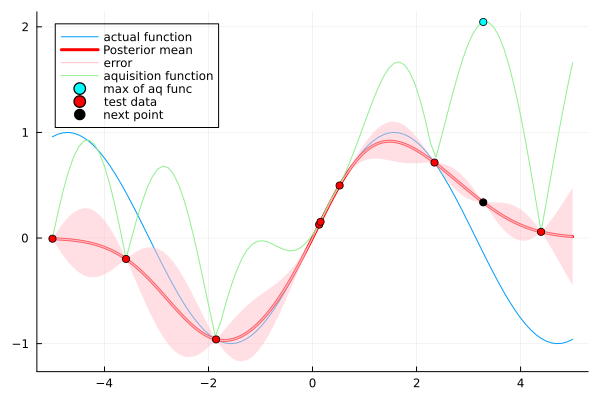

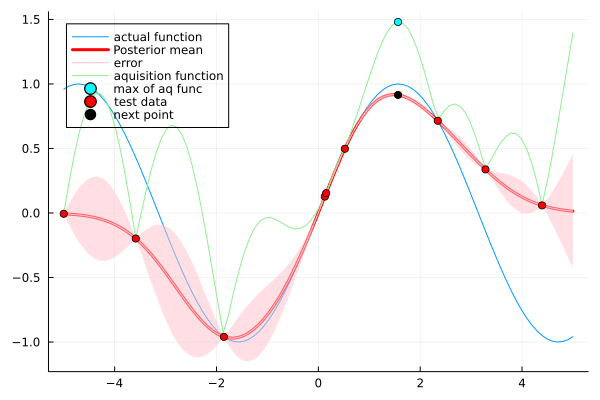

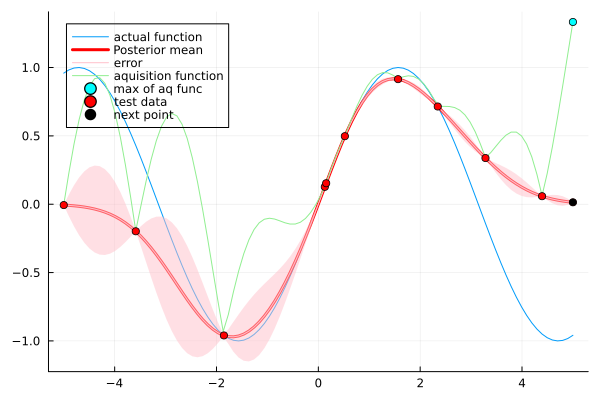

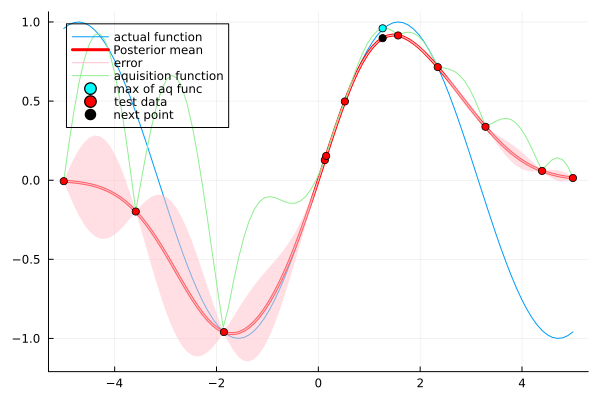

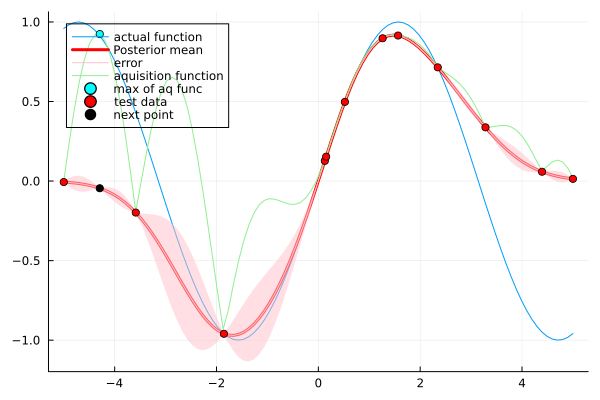

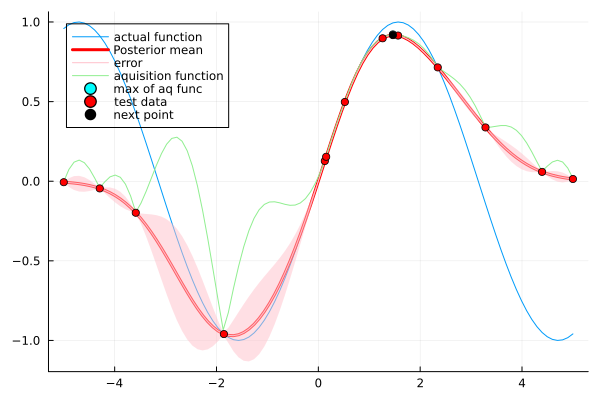

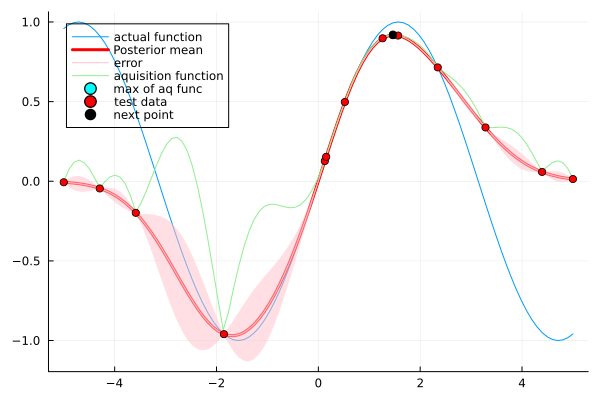

In [29]:
iteration = 10
ps = repeat([plot()], iteration)
# ps[1] = plot([2,3,4])
# ps[2] = plot([1,5])
# ps[3] = plot([10,5,1,0])
Random.seed!(123)
# X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )
# y1 = sin.(X1)./X1


mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic) 
sigma2 = sqrt.(diag(cov2))
cov2 = cov2 + Matrix( 1e-6*I, n2, n2)
for i in range(1,iteration)
    # println("plot $i")
    Random.seed!(123)

    aquisition_func = mu2 + 3*sigma2


    X1 = [X1 ; X2[argmax(aquisition_func)] ]

    # Function we want to estimate:
    # y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
    # y1 = sin.(X1)./X1
    # y1 = sin.(X1)
    y1 = [y1 ; mu2[argmax(aquisition_func)] ]

    X2 = LinRange(domain[1] , domain[2] , n2 )

    mu2 , cov2 = GP(X1 ,y1 , X2 , exponentiated_quadratic)

    sigma2 = sqrt.(diag(cov2))

    ps[i] = plot(legend=:topleft ,bg_legend = :transparent)
    plot!(X2,sin.(X2) ,label = "actual function" )
    plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
    plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
    plot!( X2 , aquisition_func,label = "aquisition function", c="light green")
    scatter!((X2[argmax(aquisition_func)],maximum(aquisition_func)),c="cyan" , label = "max of aq func")
    scatter!(X1,y1,c="red" , label="test data") 
    scatter!((X2[argmax(aquisition_func)], mu2[argmax(aquisition_func)] ),c="black" , label = "next point")
    display(ps[i])

end

In actual data , variance at the data points is never zero , so we will now impliment GP with error. Noise can be accounted for by adding it to the covariance kernel of our observations:

$\Sigma_{11} = k(X_1 , X_1) + \sigma_{\epsilon}^2I$

# GP with Error

In [33]:
function GP_with_error( X1 , y1 , X2 , kernel_func , sigma_noise)

    cov11 = (kernel_func(X1 , X1) + Matrix( sigma_noise^2 *I, length(X1[:,1]) ,length(X1[:,1]) ) 
                                  + Matrix( 1e-6*I, length(X1), length(X1)))
    cov12 = kernel_func(X1 ,X2)   + Matrix( 1e-6*I, length(X1), length(X2))
    cov22 = kernel_func(X2 , X2)  + Matrix( 1e-6*I, length(X2), length(X2))

    mu_pos = (inv(cov11) * cov12)' * y1
    cov_pos = cov22 - (inv(cov11) * cov12)' * cov12

    return mu_pos , cov_pos
end

GP_with_error (generic function with 1 method)

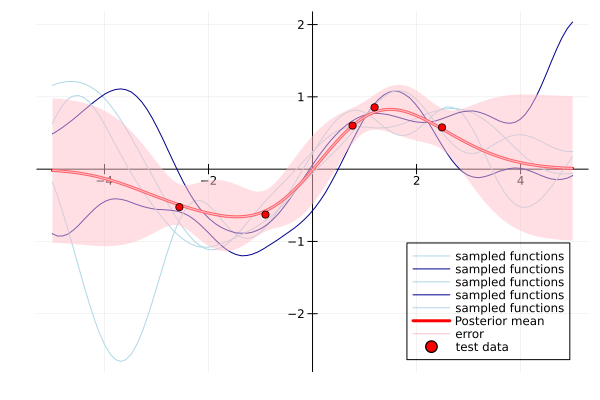

In [34]:
n1 = 5
n2 = 100
ny = 5
domain = (-5,5)
Random.seed!(1)
X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )

# Function we want to estimate:
# y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
y1 = sin.(X1)
# y1 = sin.(X1)
# y1 = sin.(X1) + cos.(X1)
# y1 = 5(X1)
# y1 = sin.(1 ./X1)
σ_noise = 0.3
y1 = y1 + ( rand(Normal(0,σ_noise^2),(n1))  )


X2 = LinRange(domain[1] , domain[2] , n2 )

mu2 , cov2 = GP_with_error(X1 ,y1 , X2 , exponentiated_quadratic , σ_noise) 

sigma2 = sqrt.(diag(cov2))


y2 =rand( MvNormal(vec(mu2), Symmetric(cov2)), ny)
p = plot(bg_legend = :transparent)
for i in range(1,ny)
    plot!(X2,y2[:,i] , label = "sampled functions" , framestyle = :origin,palette=:blues)
end

plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
scatter!(X1,y1,c="red" , label="test data") 
display(p)

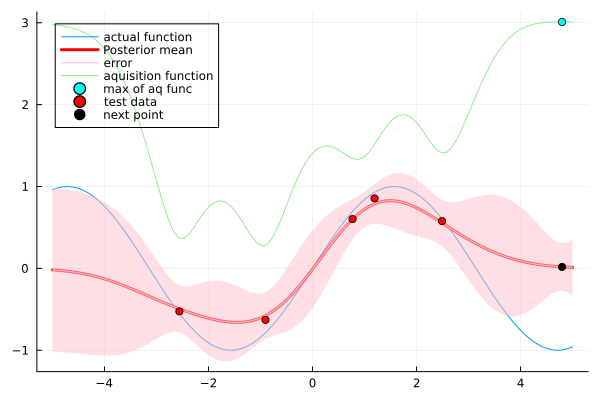

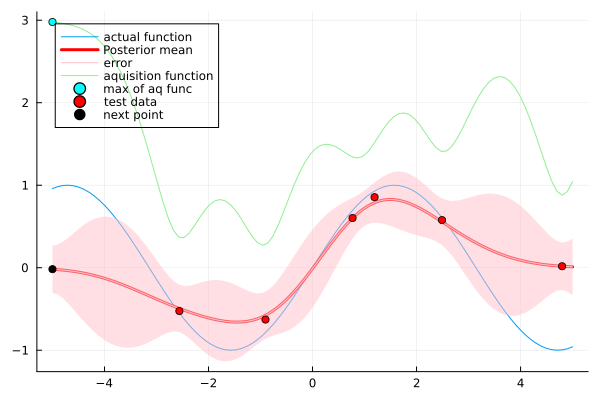

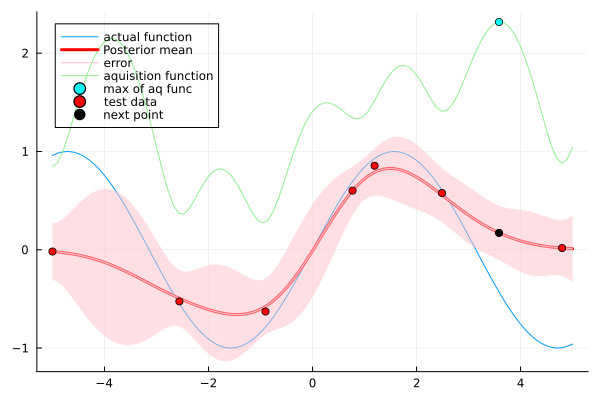

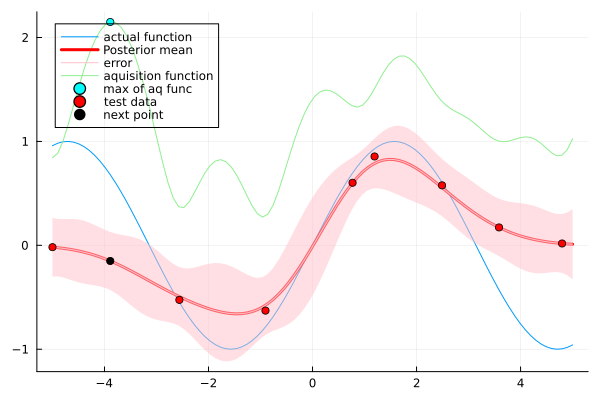

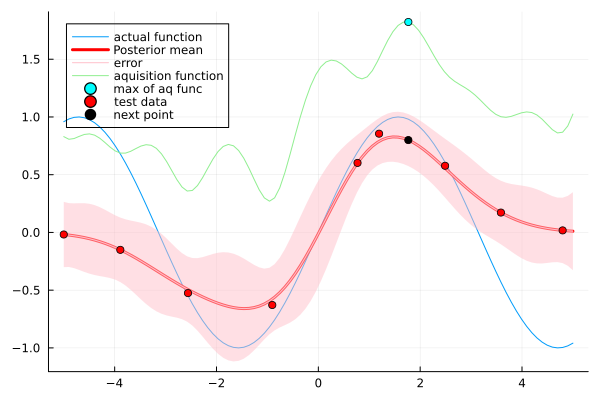

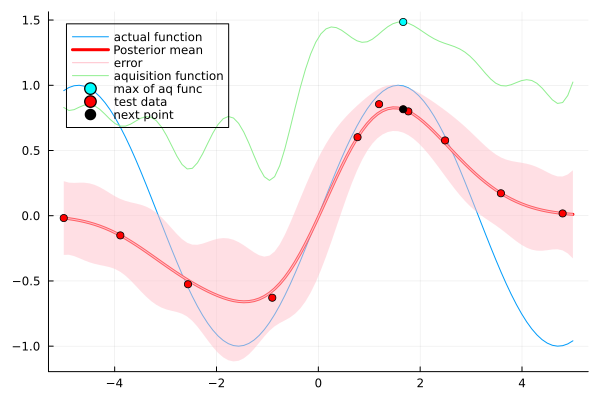

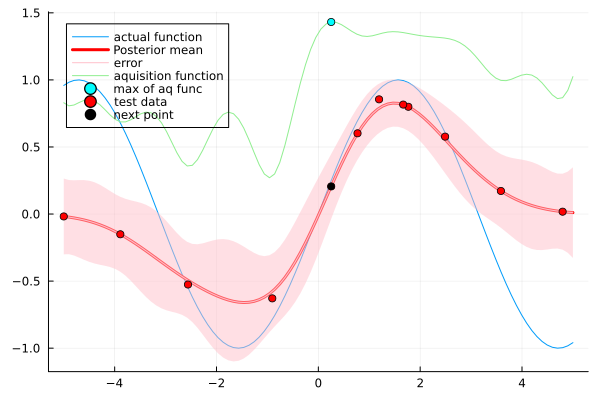

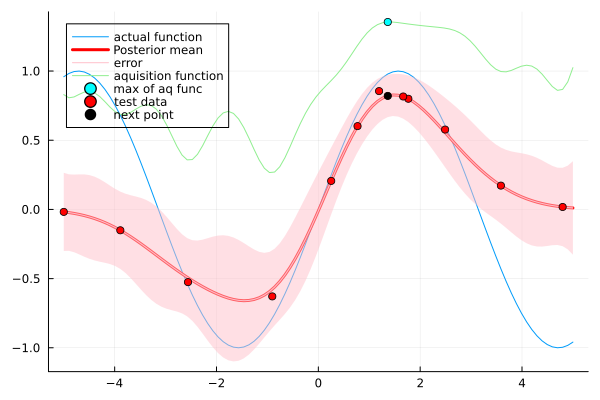

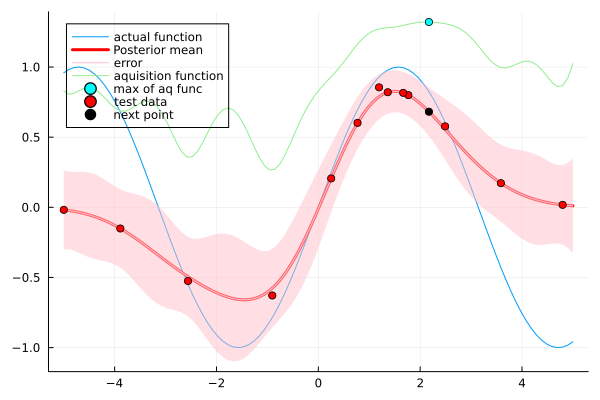

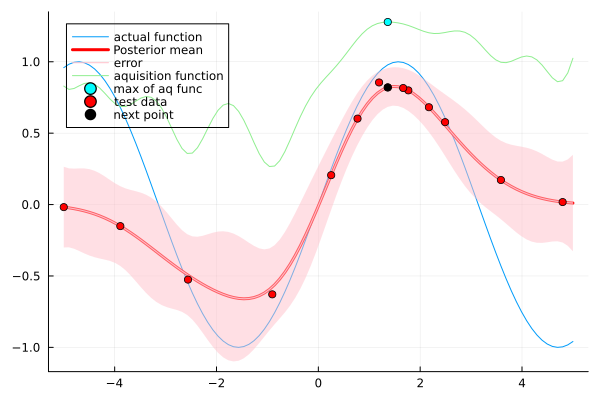

In [35]:
iteration = 10
ps = repeat([plot()], iteration)
Random.seed!(1)

# X1 = rand(Uniform(domain[1]+2 , domain[2]-2) , (n1,1) )
# y1 = sin.(X1)./X1

# y_best = maximum(y1)
mu2 , cov2 = GP_with_error(X1 ,y1 , X2 , exponentiated_quadratic , σ_noise) 
sigma2 = sqrt.(diag(cov2))

for i in range(1,iteration)
    # println("plot $i")

    aquisition_func = mu2 + 3*sigma2
    X1 = [X1 ; X2[argmax(aquisition_func)] ]

    # Function we want to estimate:
    # y1 = X1.^2 .* (sin.( 5.0 * pi .* X1 ).^6)
    # y1 = sin.(X1)./X1
    # y1 = sin.(X1)
    y1 = [y1 ; mu2[argmax(aquisition_func)] ]

    X2 = LinRange(domain[1] , domain[2] , n2 )

    mu2 , cov2 = GP_with_error(X1 ,y1 , X2 , exponentiated_quadratic , σ_noise) 

    sigma2 = sqrt.(diag(cov2))

    ps[i] = plot(legend=:topleft ,bg_legend = :transparent)

    plot!(X2,sin.(X2) ,label = "actual function" )
    plot!(X2,mu2, label="Posterior mean",c="red", linewidth=3)
    plot!(X2, mu2, label="error",  ribbon = sigma2, c= "pink")
    plot!( X2 , aquisition_func,label = "aquisition function", c="light green")
    scatter!((X2[argmax(aquisition_func)],maximum(aquisition_func)),c="cyan" , label = "max of aq func")
    scatter!(X1,y1,c="red" , label="test data") 
    scatter!((X2[argmax(aquisition_func)], mu2[argmax(aquisition_func)] ),c="black" , label = "next point")
    display(ps[i])

end

# Conclusion:

We implimented Bayesian optimization using Gaussian Process and also Gaussian Process with error. We also tried out the following aquisition functions:
- Probability of Improvement
- Probability of Improvement with trade-off parameter
- Expected Improvement with trade-off parameter
- Upper Confidence Bound


# Useful Resources:

Gaussian Processes for Machine Learning , C. E. Rasmussen & C. K. I. Williams

Statistical inference ,  George Casella, Roger L. Berger.-2nd ed

arXiv:1807.02811 (A Tutorial on Bayesian Optimization) (Awesome explanation of BO)

https://ekamperi.github.io/machine%20learning/2021/06/11/acquisition-functions.html

http://www.math.utah.edu/~zwick/Classes/Fall2012_2270/Lectures/Lecture35.pdf  (For SVD)

https://peterroelants.github.io/posts/gaussian-process-tutorial/  

https://stats.stackexchange.com/questions/573336/why-do-we-use-acquisition-functions

https://goropikari.github.io/PlotsGallery.jl/

https://www.youtube.com/watch?v=KmsDSHwgPmk&list=PLtFRWXW-prs9F-P7F09IxqDkzGyKUH0hm&pp=iAQB  (Lecture Series on Bayesian Data Analysis ,youtube channel - Sourish Das )

